In [1]:
import sympy as sp
import numpy as np

def get_robot_symbolic_model():
    # 1. Define Symbols
    theta1, theta2 = sp.symbols('theta1 theta2')
    dtheta1, dtheta2 = sp.symbols('dtheta1 dtheta2')
    u1, u2 = sp.symbols('u1 u2')
    
    # Parameters given in image
    m1, m2 = 1.0, 1.0
    l1, l2 = 0.5, 0.5
    g = 9.81
    tau = sp.Symbol('tau') # Sampling time

    # State vector x = [theta1, theta2, dtheta1, dtheta2]
    x = sp.Matrix([theta1, theta2, dtheta1, dtheta2])
    u = sp.Matrix([u1, u2])

    # 2. Define Physics Matrices (Standard 2-Link Lagrangian Dynamics)
    # These are standard formulas for the robot in your image
    c2 = sp.cos(theta2)
    s2 = sp.sin(theta2)
    
    # Inertia Matrix M(theta)
    M11 = (m1 + m2)*l1**2 + m2*l2**2 + 2*m2*l1*l2*c2
    M12 = m2*l2**2 + m2*l1*l2*c2
    M21 = M12
    M22 = m2*l2**2
    M = sp.Matrix([[M11, M12], [M21, M22]])

    # Coriolis/Centrifugal Vector C(theta, dtheta)
    h = -m2 * l1 * l2 * s2
    C1 = h * dtheta2**2 + 2 * h * dtheta1 * dtheta2
    C2 = -h * dtheta1**2
    C = sp.Matrix([C1, C2])

    # Gravity Vector G(theta)
    G1 = (m1 + m2) * g * l1 * sp.cos(theta1) + m2 * g * l2 * sp.cos(theta1 + theta2)
    G2 = m2 * g * l2 * sp.cos(theta1 + theta2)
    G_vec = sp.Matrix([G1, G2])

    # 3. Compute Acceleration: ddtheta = M_inv * (u - C - G)
    # Note: Symbolic inversion is computationally heavy, but feasible for 2DOF
    accel = M.inv() * (u - C - G_vec)

    # 4. Define Discrete Dynamics F(x, u)
    # x_next = x + tau * f(x, u)
    # f(x,u) = [dtheta; accel]
    f_continuous = sp.Matrix([dtheta1, dtheta2, accel[0], accel[1]])
    F_discrete = x + tau * f_continuous

    # 5. Compute Jacobian J = dF/dx
    J = F_discrete.jacobian(x)
    
    return J, x, u, tau

# Usage Example
J_symbolic, x_sym, u_sym, tau_sym = get_robot_symbolic_model()

print("Jacobian Matrix Shape:", J_symbolic.shape)
print("\nTop-Left Element (should be 1):", J_symbolic[0,0])
print("\nBottom-Left Element (Complex derivative):")
# This will be a massive trigonometric expression
print(str(J_symbolic[2,0])[:200] + "...")

Jacobian Matrix Shape: (4, 4)

Top-Left Element (should be 1): 1

Bottom-Left Element (Complex derivative):
tau*(-0.25*(9.81*sin(theta1) + 4.905*sin(theta1 + theta2))/(0.0625*cos(theta2)**2 - 0.125) + 4.905*(0.25*cos(theta2) + 0.25)*sin(theta1 + theta2)/(0.0625*cos(theta2)**2 - 0.125))...


Simulating...
Generating Animation...


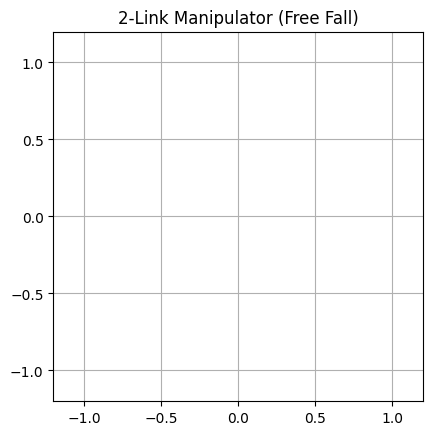

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# --- 1. System Parameters ---
m1, m2 = 5.0, 5.0  # Mass of links (kg)
l1, l2 = 0.5, 0.5  # Length of links (m)
g = 9.81           # Gravity (m/s^2)
dt = 0.01          # Time step (seconds)

# --- 2. Physics Matrices ---
# These functions match the mathematical model exactly

def get_M(theta):
    """Calculates the Inertia Matrix M(theta)"""
    t1, t2 = theta[0], theta[1]
    c2 = np.cos(t2)
    
    M11 = (m1 + m2)*l1**2 + m2*l2**2 + 2*m2*l1*l2*c2
    M12 = m2*l2**2 + m2*l1*l2*c2
    M21 = M12
    M22 = m2*l2**2
    
    return np.array([[M11, M12], 
                     [M21, M22]])

def get_C(theta, dtheta):
    """Calculates the Coriolis & Centrifugal Vector C(theta, dtheta)"""
    t2 = theta[1]
    dt1, dt2 = dtheta[0], dtheta[1]
    s2 = np.sin(t2)
    
    h = -m2 * l1 * l2 * s2
    C1 = h * dt2**2 + 2 * h * dt1 * dt2
    C2 = -h * dt1**2
    
    return np.array([C1, C2])

def get_G(theta):
    """Calculates the Gravity Vector G(theta)"""
    t1, t2 = theta[0], theta[1]
    
    G1 = (m1 + m2) * g * l1 * np.cos(t1) + m2 * g * l2 * np.cos(t1 + t2)
    G2 = m2 * g * l2 * np.cos(t1 + t2)
    
    return np.array([G1, G2])

# --- 3. Discrete Dynamics Update ---
def step(x, u):
    """
    Computes x(k+1) given x(k) and u(k).
    x = [theta1, theta2, dtheta1, dtheta2]
    """
    theta = x[:2]
    dtheta = x[2:]
    
    # Calculate physics terms
    M = get_M(theta)
    C = get_C(theta, dtheta)
    G = get_G(theta)
    
    # Compute Acceleration: ddtheta = M_inv * (u - C - G)
    # We use np.linalg.solve for better numerical stability than inv()
    torques = u - C - G
    ddtheta = np.linalg.solve(M, torques)
    
    # Update State (Euler Integration)
    # Position: new_pos = old_pos + dt * old_vel
    theta_next = theta + dt * dtheta
    # Velocity: new_vel = old_vel + dt * accel
    dtheta_next = dtheta + dt * ddtheta
    
    return np.concatenate([theta_next, dtheta_next])

# --- 4. Simulation Setup ---

# Initial Condition: Arm held out horizontally
# x = [pi/2, 0, 0, 0] would be straight up, [0, 0, 0, 0] is horizontal right
x_current = np.array([0.5, 0.2, 0.0, 0.0]) 

# Simulation settings
duration = 10.0  # seconds
steps = int(duration / dt)
history = []

print("Simulating...")
for _ in range(steps):
    # u = [0, 0] means NO MOTORS (free swing under gravity)
    # You can change this to [10.0, 0.0] to add torque to the first joint
    u_input = np.array([0.0, 0.0]) 
    
    history.append(x_current)
    x_current = step(x_current, u_input)
history = np.array(history)

# --- 5. Visualization / Animation ---
print("Generating Animation...")

fig, ax = plt.subplots()
ax.set_xlim(-(l1+l2+0.2), (l1+l2+0.2))
ax.set_ylim(-(l1+l2+0.2), (l1+l2+0.2))
ax.set_aspect('equal')
ax.grid(True)
ax.set_title("2-Link Manipulator (Free Fall)")

# Elements to draw
line, = ax.plot([], [], 'o-', lw=4, color='blue') # The arm links
trace, = ax.plot([], [], '-', lw=1, color='red', alpha=0.5) # Path trace
trace_x, trace_y = [], []

def init():
    line.set_data([], [])
    trace.set_data([], [])
    return line, trace

def animate(i):
    # Extract angles for this time step
    state = history[i]
    t1 = state[0]
    t2 = state[1]
    
    # Forward Kinematics (Angles -> XY Coordinates)
    # Joint 1 (Base) is at (0,0)
    # Joint 2 position
    x1 = l1 * np.cos(t1)
    y1 = l1 * np.sin(t1)
    # End-Effector position
    x2 = x1 + l2 * np.cos(t1 + t2)
    y2 = y1 + l2 * np.sin(t1 + t2)
    
    # Update the arm line
    line.set_data([0, x1, x2], [0, y1, y2])
    
    # Update the trace (optional, shows path)
    if i % 5 == 0: # Only store trace every 5 frames to save memory
        trace_x.append(x2)
        trace_y.append(y2)
    trace.set_data(trace_x, trace_y)
    
    return line, trace

# Create the animation
ani = animation.FuncAnimation(fig, animate, frames=range(0, steps, 4), 
                              init_func=init, blit=True, interval=dt*1000*4)

plt.show()

In [7]:
from IPython.display import HTML

# ... (Keep Parts 1-4 exactly the same: setup parameters, physics, simulation loop) ...

# --- 5. Jupyter Notebook Visualization ---
print("Generating Animation for Jupyter...")

fig, ax = plt.subplots(figsize=(6, 6))

# Set fixed limits
limit = l1 + l2 + 0.2
ax.set_xlim(-limit, limit)
ax.set_ylim(-limit, limit)
ax.set_aspect('equal')
ax.grid(True)
ax.set_title("2-Link Manipulator (Gravity Fall)")

# Create the line objects
line, = ax.plot([], [], 'o-', lw=5, color='cornflowerblue', markerfacecolor='black', markersize=8)
trace, = ax.plot([], [], '-', lw=1, color='red', alpha=0.5)

# Storage for the trace
trace_x = []
trace_y = []

def animate(i):
    state = history[i]
    t1, t2 = state[0], state[1]
    
    # Forward Kinematics
    x0, y0 = 0, 0
    x1 = l1 * np.cos(t1)
    y1 = l1 * np.sin(t1)
    x2 = x1 + l2 * np.cos(t1 + t2)
    y2 = y1 + l2 * np.sin(t1 + t2)
    
    # Update plot data
    line.set_data([x0, x1, x2], [y0, y1, y2])
    
    if i % 5 == 0:
        trace_x.append(x2)
        trace_y.append(y2)
        trace.set_data(trace_x, trace_y)
    
    return line, trace

# Create Animation
ani = animation.FuncAnimation(
    fig, 
    animate, 
    frames=range(0, steps, 5), # Skip frames for speed
    interval=30, 
    blit=False 
)

# --- CRITICAL LINE FOR JUPYTER ---
# This converts the animation to HTML/JS and displays it in the notebook
plt.close() # Prevents a double static image from appearing
HTML(ani.to_jshtml())

Generating Animation for Jupyter...
